## Find cell groups by their cofiring during a theta cycle

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import cupy as cp
import numpy as np
import datajoint as dj
import spyglass as nd
import pandas as pd
import matplotlib.pyplot as plt
import json
import multiprocessing

# ignore datajoint+jupyter async warnings
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

In [3]:
from spyglass.common import (Session, IntervalList,LabMember, LabTeam, Raw, Session, Nwbfile,
                            Electrode,LFPBand,interval_list_intersect)
from spyglass.common import TaskEpoch
import spyglass.spikesorting.v0 as ss

from spyglass.spikesorting.v0 import (SortGroup, 
                                    SortInterval,
                                    SpikeSortingPreprocessingParameters,
                                    SpikeSortingRecording, 
                                    SpikeSorterParameters,
                                    SpikeSortingRecordingSelection,
                                    ArtifactDetectionParameters, ArtifactDetectionSelection,
                                    ArtifactRemovedIntervalList, ArtifactDetection,
                                      SpikeSortingSelection, SpikeSorting,
                                   CuratedSpikeSortingSelection,CuratedSpikeSorting,Curation)
from spyglass.spikesorting.v0.curation_figurl import CurationFigurl,CurationFigurlSelection
from spyglass.spikesorting.v0.spikesorting_curation import MetricParameters,MetricSelection,QualityMetrics
from spyglass.spikesorting.v0.spikesorting_curation import WaveformParameters,WaveformSelection,Waveforms
from spyglass.common.common_position import IntervalPositionInfo, IntervalPositionInfoSelection,IntervalLinearizedPosition

from spyglass.utils.nwb_helper_fn import get_nwb_copy_filename
from pprint import pprint
from spyglass.shijiegu.ripple_detection import removeDataBeforeTrial1
from spyglass.shijiegu.helpers import interpolate_to_new_time
from spyglass.shijiegu.placefield import place_field,placefield_to_peak1dloc
from spyglass.shijiegu.Analysis_SGU import DecodeResultsLinear
warnings.simplefilter("ignore", category=DeprecationWarning)
warnings.simplefilter("ignore", category=ResourceWarning)
warnings.filterwarnings('ignore')

[2024-08-14 09:54:30,741][INFO]: Connecting shijiegu-alt@lmf-db.cin.ucsf.edu:3306
[2024-08-14 09:54:30,985][INFO]: Connected shijiegu-alt@lmf-db.cin.ucsf.edu:3306


In [81]:
import matplotlib
from spyglass.shijiegu.helpers import interval_union
from spyglass.shijiegu.Analysis_SGU import TrialChoice,RippleTimes,TetrodeNumber,EpochPos,ExtendedRippleTimes,RippleTimesWithDecode
from spyglass.shijiegu.load import load_run_sessions
from spyglass.shijiegu.singleUnit import (do_mountainSort,electrode_unit,RippleTime2FiringRate,findWaveForms,RippleTime2Index,find_spikes
                            )
from spyglass.shijiegu.fragmented import permute_frag_cont,find_spike_count_ratio,get_nwb_units,classify_cells,find_firing_cross_correlation
from spyglass.shijiegu.placefield import place_field, cell_by_arm

In [205]:
from spyglass.shijiegu.placefield import raster_field

In [223]:
nwb_file_name = "eliot20221022.nwb"
nwb_copy_file_name = "eliot20221022_.nwb"
run_session_ids, run_session_names, pos_session_names = load_run_sessions(nwb_copy_file_name)

*nwb_file_name *epoch    epoch_name     position_inter
+------------+ +-------+ +------------+ +------------+
eliot20221022_ 1         01_Seq2Sleep1  pos 0 valid ti
eliot20221022_ 2         02_Seq2Session pos 1 valid ti
eliot20221022_ 3         03_Seq2Sleep2  pos 2 valid ti
eliot20221022_ 4         04_Seq2Session pos 3 valid ti
eliot20221022_ 5         05_Seq2Sleep3  pos 4 valid ti
eliot20221022_ 6         06_Seq2Session pos 5 valid ti
eliot20221022_ 7         07_Seq2Sleep4  pos 6 valid ti
eliot20221022_ 8         08_Seq2Session pos 7 valid ti
eliot20221022_ 9         09_Seq2Sleep5  pos 8 valid ti
eliot20221022_ 10        10_Seq2Session pos 9 valid ti
eliot20221022_ 11        11_Seq2Sleep6  pos 10 valid t
 (Total: 11)



In [234]:
epoch_num = 3
epoch_ID = 8
session_name = run_session_names[epoch_num]
pos_name = pos_session_names[epoch_num]

In [7]:
ripple_times = pd.DataFrame((RippleTimesWithDecode & 
                             {'nwb_file_name': nwb_copy_file_name, 'interval_list_name': session_name}).fetch1('ripple_times'))

### 1. Get spike

In [8]:
key = {"nwb_file_name": nwb_copy_file_name,
       "sorter":"mountainsort4",
       "sort_interval_name":session_name}

sort_group_ids = np.unique((QualityMetrics & key).fetch("sort_group_id"))
sort_group_ids_with_good_cell = []
for sort_group_id in sort_group_ids:
    nwb_units = electrode_unit(nwb_copy_file_name,session_name,sort_group_id)
    if len(nwb_units)==0:
        continue
    sort_group_ids_with_good_cell.append(sort_group_id)
print("sort groups are: ",sort_group_ids_with_good_cell)

nwb_units_all = get_nwb_units(nwb_copy_file_name,session_name,sort_group_ids_with_good_cell)
count_ratio, firing_rate_F, firing_rate_C = find_spike_count_ratio(nwb_units_all,ripple_times)
cells_frag, cells_cont = classify_cells(firing_rate_F, firing_rate_C)

cell_list = []
for e in sort_group_ids_with_good_cell:
    for u in nwb_units_all[e].index:
        cell_list.append((e, u))

sort groups are:  [0, 2, 5, 13, 14, 16, 17, 20, 23, 26, 27, 30, 31]
electrode 0 unit 3
during fragmented replay:  7.304430676138095 31.0
during cont replay:  3.709264109928835 84.0
electrode 0 unit 4
during fragmented replay:  0.23562679600445469 1.0
during cont replay:  0.04415790607058137 1.0
electrode 0 unit 6
during fragmented replay:  2.8275215520534562 12.0
during cont replay:  1.9871057731761617 45.0
electrode 0 unit 7
during fragmented replay:  3.5344019400668203 15.0
during cont replay:  0.7506844031998833 17.0
electrode 0 unit 8
during fragmented replay:  1.1781339800222734 5.0
during cont replay:  0.1324737182117441 3.0
electrode 2 unit 3
during fragmented replay:  2.356267960044547 10.0
during cont replay:  1.1481055578351156 26.0
electrode 5 unit 2
during fragmented replay:  0.0 0.0
during cont replay:  0.9273160274822088 21.0
electrode 5 unit 5
during fragmented replay:  2.120641164040092 9.0
during cont replay:  0.30910534249406957 7.0
electrode 5 unit 6
during fragmente

In [127]:
cell_list = []
for e in sort_group_ids_with_good_cell:
    for u in nwb_units_all[e].index:
        cell_list.append((e, u))
        
placefields = {}
mobility_spike_counts = {}
all_spike_counts = {}
peak_frs = {}
for row_ind in range(len(cell_list)):
    print(row_ind)
    e = cell_list[row_ind][0]
    u = cell_list[row_ind][1]
    placefield, peak_fr, xbins, ybins, mobility_spike_count, all_spike_count = place_field(
        nwb_copy_file_name, session_name, pos_name, e, u)
    placefields[(e,u)] = placefield
    peak_frs[(e,u)] = peak_fr
    mobility_spike_counts[(e,u)] = mobility_spike_count
    all_spike_counts[(e,u)] = all_spike_count

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89


In [206]:
rasters = {}
for row_ind in range(len(cell_list)):
    print(row_ind)
    e = cell_list[row_ind][0]
    u = cell_list[row_ind][1]
    pos2d, pos2d_spike_time, _ = raster_field(
        nwb_copy_file_name, session_name, pos_name, e, u)
    rasters[(e,u)] = pos2d_spike_time

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89


### 2. Load theta table (chopped up cycle by cycle)

In [516]:
from spyglass.shijiegu.Analysis_SGU import get_linearization_map,segment_to_linear_range,ThetaIntervals
from spyglass.shijiegu.theta import theta_parser_master,return_skaggs_theta, return_theta_phase_location
from spyglass.shijiegu.load import load_position

import xarray as xr

In [522]:
theta_intervals_df, pos1d = theta_parser_master(
    nwb_copy_file_name, pos_name, session_name, nwb_units_all,cell_list)

[15:01:02][WARNING] Spyglass: Deprecation: this class has been moved out of spyglass.common.common_position
	TrackGraph -> spyglass.linearization.v0.main.TrackGraph
Please use the new location.


parsing thetas cycle by cycle.
Done parsing thetas cycle by cycle.
Done inserting into Spyglass.


In [558]:
theta_intervals_df

,theta_interval,start_time,end_time,animal_location,trial_number,head_orientation,active_cells_ind,active_cells
0,"[1666477182.187831, 1666477182.3308313]",1.666477e+09,1.666477e+09,well3,1,-1.1330665378496885,"[2, 32, 56, 57, 89]","[(0, 6), (14, 13), (20, 3), (20, 4), (31, 3)]"
1,"[1666477182.3318315, 1666477182.4488316]",1.666477e+09,1.666477e+09,well3,1,-0.9744383679055271,"[32, 57, 63, 85, 89]","[(14, 13), (20, 4), (23, 4), (30, 7), (31, 3)]"
2,"[1666477182.4498315, 1666477182.5598316]",1.666477e+09,1.666477e+09,well3,1,-0.5900284473906585,"[32, 57]","[(14, 13), (20, 4)]"
3,"[1666477182.5608315, 1666477182.6838317]",1.666477e+09,1.666477e+09,well3,1,-0.4171337985391088,"[30, 32, 56, 63]","[(14, 11), (14, 13), (20, 3), (23, 4)]"
4,"[1666477182.6848319, 1666477182.8078318]",1.666477e+09,1.666477e+09,well3,1,-0.34344932044747545,"[30, 35, 39, 56]","[(14, 11), (14, 19), (16, 5), (20, 3)]"
...,...,...,...,...,...,...,...,...
6586,"[1666478916.1434383, 1666478916.2674384]",1.666479e+09,1.666479e+09,arm4,81,0.03098542090237862,"[28, 64, 88, 89]","[(14, 9), (23, 5), (31, 2), (31, 3)]"
6587,"[1666478916.2684383, 1666478916.3834386]",1.666479e+09,1.666479e+09,well4,81,-0.0006521670277134564,"[12, 57, 64, 70]","[(5, 11), (20, 4), (23, 5), (26, 9)]"
6588,"[1666478916.3844385, 1666478916.5034387]",1.666479e+09,1.666479e+09,well4,81,-0.1418193182841744,[64],"[(23, 5)]"
6589,"[1666478916.5044386, 1666478916.6264386]",1.666479e+09,1.666479e+09,well4,81,-0.01063635717775842,"[35, 57, 64, 70, 89]","[(14, 19), (20, 4), (23, 5), (26, 9), (31, 3)]"


### 3. investigate out of field firing and cell groups that fire during theta

In [587]:
from spyglass.shijiegu.fragmented_graph import find_active_cells_intvl, make_graph, plot_graph, cell_name_to_ind
from spyglass.shijiegu.theta import (find_cofiring_theta_cycle,
                find_cell_connectivity_theta,
                find_theta_cycle,sort_connectivity,
                plot_cell_spikes,plot_place_field_group,scatter_place_field_group)

[16:05:58][WARNING] Spyglass: Deprecation: this class has been moved out of spyglass.common.common_position
	TrackGraph -> spyglass.linearization.v0.main.TrackGraph
Please use the new location.


In [529]:
weightMatrix = find_cell_connectivity_theta(cell_list,theta_intervals_df)

The shape of the weightMatrix is:  (90, 90)


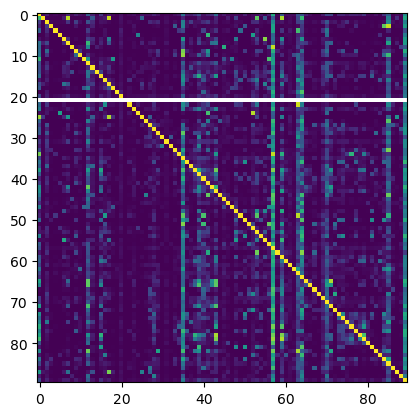

In [530]:
plt.imshow(weightMatrix)

In [772]:
ref_cell_name = (26,16)#(17,4)
ref_cell_ind = cell_name_to_ind(ref_cell_name, cell_list)

In [773]:
cell_connected_ind, cell_connected_name, weight_connected = sort_connectivity(weightMatrix,
                                                                              ref_cell_name, cell_list)

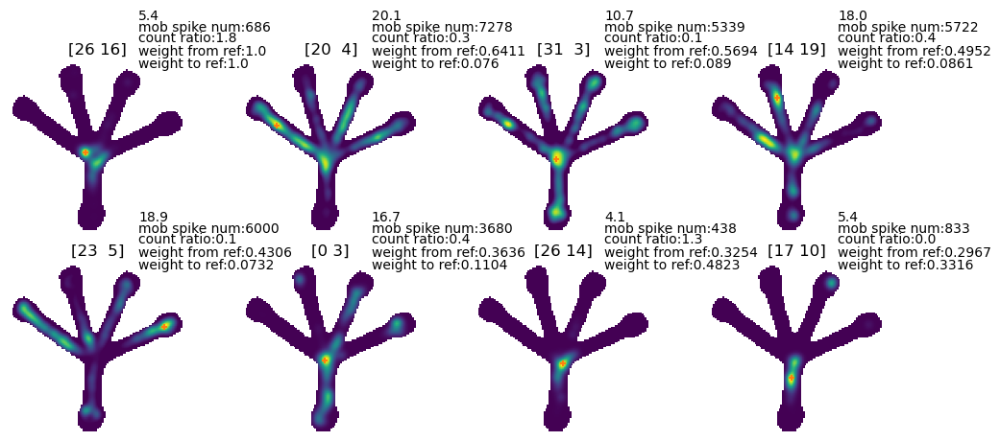

In [774]:
cells_highscore = np.array(cell_list)[cell_connected_ind[:8]]

fig, axes = plot_place_field_group(cells_highscore,placefields,cell_list,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

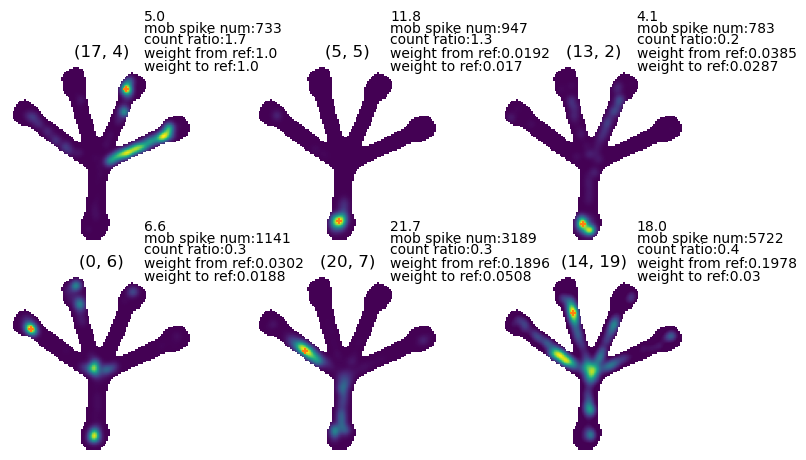

In [738]:
#pairs_fragmented = [(13,4),(14,21),(5,11),(17,13),(14,19),(16,8),(23,4),(23,5)]
#cells_fragmented = [(30,3),(0,4),(13,2),(13,8),(26,7),(5,11),(16,11),(13,9)]
#pairs_fragmented = [(17,4),(5,5),(13,2),(13,8),(26,7),(16,9),(0,6),(5,11),(13,10),(20,7),
#                    (20,12),(14,19),(17,14),(16,11),(23,4),(17,5),(31,2),(16,8),(30,3)]
#cells_fragmented = [(17,4),(5,5),(13,2),(0,6),(20,7),(14,19)]
#cells_fragmented = [(30,4),(16,5),(5,11),(26,5),(13,7),(14,19),(16,8),(17,14),(20,5),(20,8)]

fig, axes = plot_place_field_group(cells_fragmented,placefields,cell_list,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

In [798]:
#cells_fragmented_all = [(17,4),(5,5),(16,9),
#                        (16,10),(26,7),(13,2),(5,11),(17,13),(23,4),
#                        (20,7),(17,5),(13,7),(0,6),(20,12),(14,19),(31,2)]
#cells_cont_all = [(17,4),(17,6)]


cells_fragmented_all = [(26,16),(16,9),(26,7),(26,20),(5,11),(20,7),(20,12),
                        (13,7),(13,17),(14,19),(16,8),(26,22),
                        (23,4),(5,9),(17,4),(17,5),(23,5),(31,2)]

cells_cont_all = [(26,16),(5,5),(13,2),(16,5),(16,9),(0,6),(5,11),
                  (20,7),(14,19),(16,8),(26,22),(14,22),(16,11),(23,4),(17,5)]

cells_fragmented_ind = [cell_name_to_ind(cell_name,cell_list) for cell_name in cells_fragmented_all]
cells_cont_ind = [cell_name_to_ind(cell_name,cell_list) for cell_name in cells_cont_all]

fragmented_unique_ind = np.setdiff1d(cells_fragmented_ind, cells_cont_ind)
fragmented_unique_ind = np.concatenate((ref_cell_ind.reshape((1)),fragmented_unique_ind))
fragmented_unique = np.array(cell_list)[fragmented_unique_ind]

cont_unique_ind = np.setdiff1d(cells_cont_ind, cells_fragmented_ind)
cont_unique_ind = np.concatenate((ref_cell_ind.reshape((1)),cont_unique_ind))
cont_unique = np.array(cell_list)[cont_unique_ind]

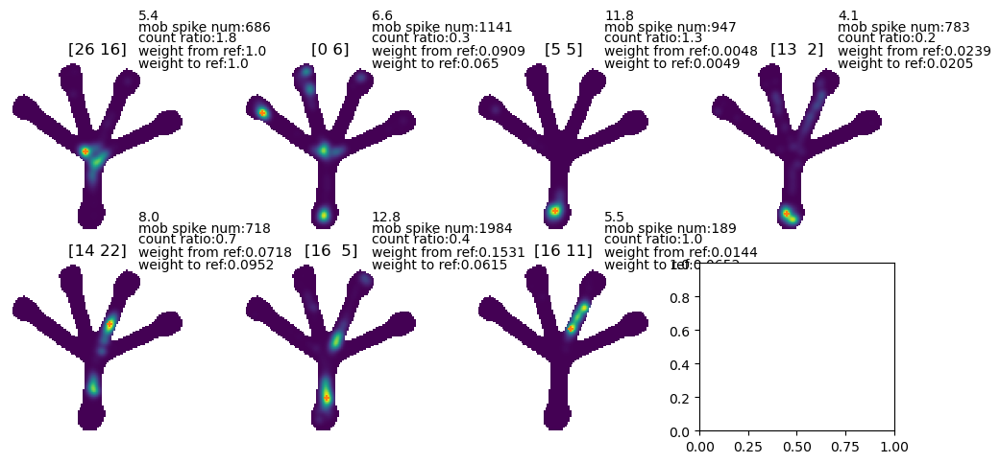

In [799]:
fig, axes = plot_place_field_group(cont_unique,placefields,cell_list,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

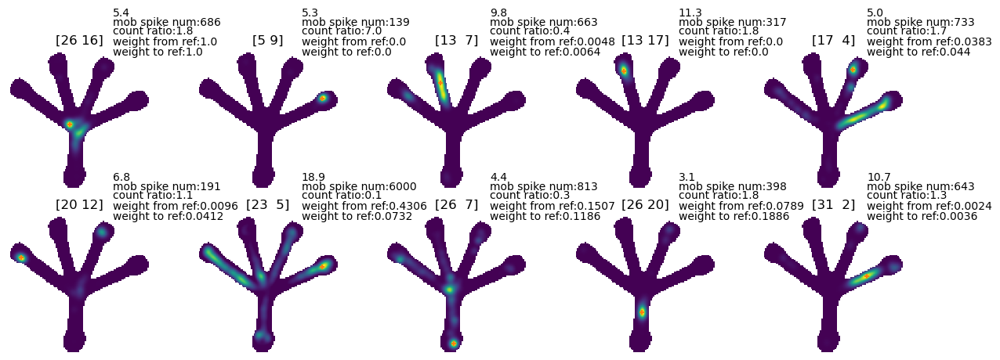

In [800]:
fig, axes = plot_place_field_group(fragmented_unique,placefields,cell_list,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

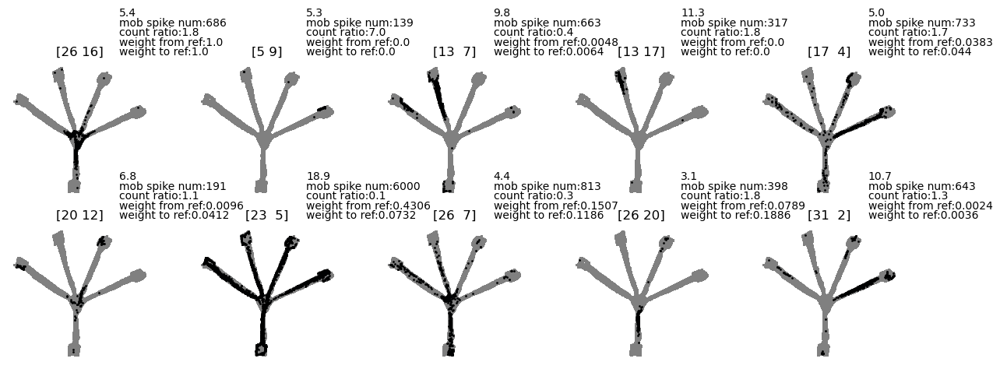

In [801]:
fig, axes = scatter_place_field_group(fragmented_unique,rasters,cell_list,pos2d,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

In [767]:
cells_fragmented_ind

[45, 7, 42, 43, 69, 13, 12, 52, 63, 59, 46, 16, 2, 62, 35, 88]

In [779]:
cell_connected_ind, cell_connected_name, weight_connected

for ind in range(len(cell_connected_ind)):
    current_name = cell_connected_name[ind]
    current_index = cell_connected_ind[ind]
    current_weight = weight_connected[ind]
    if np.isin(current_index,cells_fragmented_ind):
        print(current_name,current_weight,"==== implicated in frag replay")
    if np.isin(current_index,cells_cont_ind):
        print(current_name,current_weight,"|||| cont replay")
    elif not np.isin(current_index,cells_fragmented_ind):
        print(current_name,current_weight)

[26 16] 1.0 ==== implicated in frag replay
[26 16] 1.0 |||| cont replay
[20  4] 0.6411483253588517
[31  3] 0.569377990430622
[14 19] 0.49521531100478466 ==== implicated in frag replay
[14 19] 0.49521531100478466 |||| cont replay
[23  5] 0.430622009569378 ==== implicated in frag replay
[0 3] 0.36363636363636365
[26 14] 0.3253588516746411
[17 10] 0.2966507177033493
[26  9] 0.284688995215311
[30  5] 0.24880382775119617
[30  7] 0.24162679425837322
[14 20] 0.22966507177033493
[16  6] 0.22248803827751196
[17 15] 0.22009569377990432
[20  7] 0.20813397129186603 ==== implicated in frag replay
[20  7] 0.20813397129186603 |||| cont replay
[5 7] 0.20095693779904306
[16 10] 0.18899521531100477
[14  9] 0.18181818181818182
[13  4] 0.17703349282296652
[14  8] 0.16507177033492823
[ 5 11] 0.15789473684210525 ==== implicated in frag replay
[ 5 11] 0.15789473684210525 |||| cont replay
[26 19] 0.15311004784688995
[16  5] 0.15311004784688995 |||| cont replay
[26  7] 0.1507177033492823 ==== implicated in fra

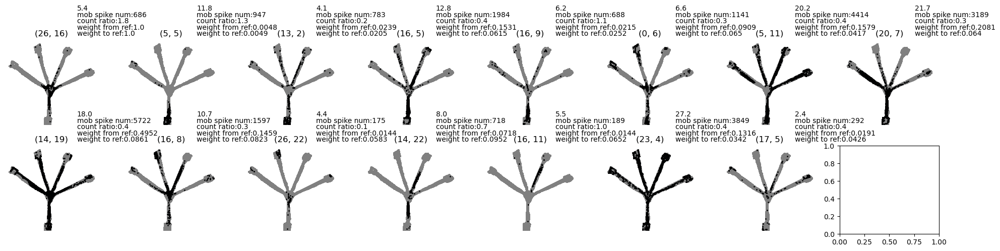

In [780]:
fig, axes = scatter_place_field_group(cells_cont_all,rasters,cell_list,pos2d,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

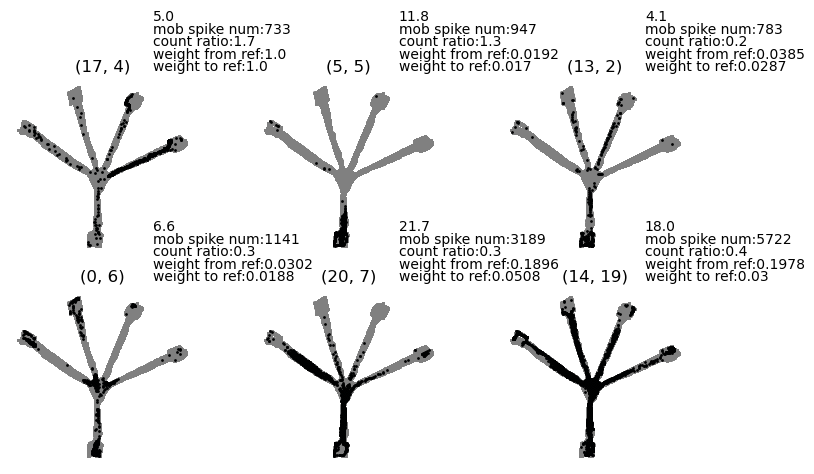

In [739]:
fig, axes = scatter_place_field_group(cells_fragmented,rasters,cell_list,pos2d,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

In [817]:
# off main field theta_cycles_ind
#query_cell_list = [ref_cell_name,(5,11),(20,7)]
query_cell_list = [ref_cell_name,(17,4),(31,3)]
offfield_theta_ind = find_theta_cycle(theta_intervals_df, cell_list, # session info
                                    query_cell_list, #required cell name to be in the theta cycle
                                    animal_location = None, # required animal location
                                    criteron_num = len(query_cell_list), ref_cell = ref_cell_name)

print('Found '+str(len(offfield_theta_ind))+' theta cycles')
weightMatrix_sub = find_cell_connectivity_theta(cell_list,
                                                theta_intervals_df.loc[offfield_theta_ind])
cells_offfield_ind, cells_offfield_name, weight_offfield = sort_connectivity(weightMatrix_sub, ref_cell_name, cell_list)

Found 5 theta cycles
The shape of the weightMatrix is:  (90, 90)


In [818]:
theta_intervals_df.loc[offfield_theta_ind]

,theta_interval,start_time,end_time,animal_location,trial_number,head_orientation,active_cells_ind,active_cells
862,"[1666477454.122078, 1666477454.241078]",1.666477e+09,1.666477e+09,arm0,10,2.394268874091382,"[15, 35, 38, 39, 40, 43, 45, 57, 59, 60, 73, 7...","[(13, 4), (14, 19), (14, 22), (16, 5), (16, 6)..."
1951,"[1666477737.6723685, 1666477737.7893689]",1.666478e+09,1.666478e+09,arm0,24,-1.3291243109589617,"[14, 15, 36, 45, 50, 54, 64, 74, 85, 89]","[(13, 3), (13, 4), (14, 20), (17, 4), (17, 10)..."
1960,"[1666477738.7263696, 1666477738.8353698]",1.666478e+09,1.666478e+09,center1,24,-2.3327467576031373,"[35, 45, 69, 74, 89]","[(14, 19), (17, 4), (26, 7), (26, 16), (31, 3)]"
3217,"[1666478058.2406597, 1666478058.3706598]",1.666478e+09,1.666478e+09,center1,40,-1.70580733214757,"[2, 9, 27, 40, 45, 57, 70, 74, 89]","[(0, 6), (5, 7), (14, 8), (16, 6), (17, 4), (2..."
3876,"[1666478246.2598302, 1666478246.3768306]",1.666478e+09,1.666478e+09,arm4,48,2.984467608508355,"[12, 31, 43, 45, 59, 74, 85, 89]","[(5, 11), (14, 12), (16, 10), (17, 4), (20, 7)..."


In [808]:
list(theta_intervals_df.loc[offfield_theta_ind].active_cells)

[[(14, 4),
  (16, 5),
  (16, 8),
  (17, 4),
  (20, 4),
  (23, 5),
  (26, 9),
  (26, 16),
  (30, 7)]]

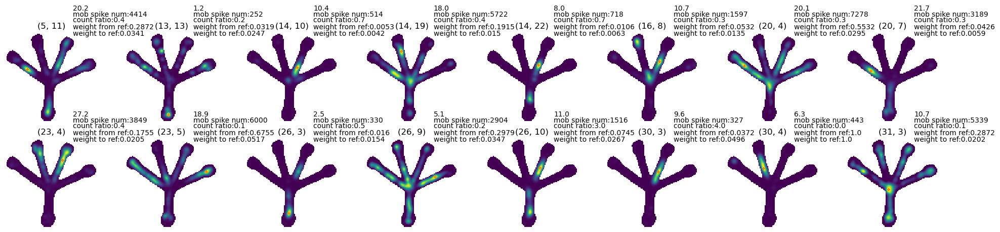

In [696]:
fig, axes = plot_place_field_group(theta_intervals_df.loc[4998].active_cells,placefields,cell_list,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

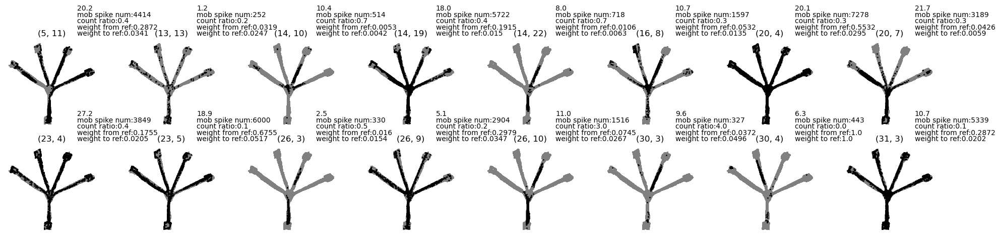

In [697]:
fig, axes = scatter_place_field_group(theta_intervals_df.loc[4998].active_cells,rasters,cell_list,pos2d,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

In [804]:
theta_intervals_df.loc[offfield_theta_ind]

,theta_interval,start_time,end_time,animal_location,trial_number,head_orientation,active_cells_ind,active_cells
862,"[1666477454.122078, 1666477454.241078]",1.666477e+09,1.666477e+09,arm0,10,2.394268874091382,"[15, 35, 38, 39, 40, 43, 45, 57, 59, 60, 73, 7...","[(13, 4), (14, 19), (14, 22), (16, 5), (16, 6)..."
1951,"[1666477737.6723685, 1666477737.7893689]",1.666478e+09,1.666478e+09,arm0,24,-1.3291243109589617,"[14, 15, 36, 45, 50, 54, 64, 74, 85, 89]","[(13, 3), (13, 4), (14, 20), (17, 4), (17, 10)..."
1960,"[1666477738.7263696, 1666477738.8353698]",1.666478e+09,1.666478e+09,center1,24,-2.3327467576031373,"[35, 45, 69, 74, 89]","[(14, 19), (17, 4), (26, 7), (26, 16), (31, 3)]"
2456,"[1666477854.902475, 1666477855.0154753]",1.666478e+09,1.666478e+09,center1,30,-1.0477042064183462,"[12, 43, 45, 59, 64, 74, 84, 85]","[(5, 11), (16, 10), (17, 4), (20, 7), (23, 5),..."
2592,"[1666477891.117508, 1666477891.2395082]",1.666478e+09,1.666478e+09,arm3,32,-0.734652520736317,"[26, 39, 41, 45, 57, 64, 70, 74, 85]","[(14, 4), (16, 5), (16, 8), (17, 4), (20, 4), ..."
3217,"[1666478058.2406597, 1666478058.3706598]",1.666478e+09,1.666478e+09,center1,40,-1.70580733214757,"[2, 9, 27, 40, 45, 57, 70, 74, 89]","[(0, 6), (5, 7), (14, 8), (16, 6), (17, 4), (2..."
3323,"[1666478086.5346854, 1666478086.6476855]",1.666478e+09,1.666478e+09,center1,41,2.9794980348051325,"[12, 28, 43, 45, 57, 59, 63, 73, 74, 85]","[(5, 11), (14, 9), (16, 10), (17, 4), (20, 4),..."
3876,"[1666478246.2598302, 1666478246.3768306]",1.666478e+09,1.666478e+09,arm4,48,2.984467608508355,"[12, 31, 43, 45, 59, 74, 85, 89]","[(5, 11), (14, 12), (16, 10), (17, 4), (20, 7)..."
4096,"[1666478298.837878, 1666478298.9558783]",1.666478e+09,1.666478e+09,arm4,51,3.0315015704224533,"[12, 43, 45, 57, 59, 70, 73, 74, 85]","[(5, 11), (16, 10), (17, 4), (20, 4), (20, 7),..."
4768,"[1666478455.1480198, 1666478455.27102]",1.666478e+09,1.666478e+09,arm4,59,3.0071092405553848,"[12, 43, 45, 57, 63, 64, 74, 85]","[(5, 11), (16, 10), (17, 4), (20, 4), (23, 4),..."


In [815]:
intersect_cell_ind = np.intersect1d(np.intersect1d(theta_intervals_df.loc[offfield_theta_ind[0]].active_cells_ind,
               theta_intervals_df.loc[offfield_theta_ind[1]].active_cells_ind),
                theta_intervals_df.loc[offfield_theta_ind[2]].active_cells_ind)

intersect_cell_name = np.array(cell_list)[intersect_cell_ind]

In [816]:
intersect_cell_name

array([[17,  4],
       [26, 16],
       [31,  3]])

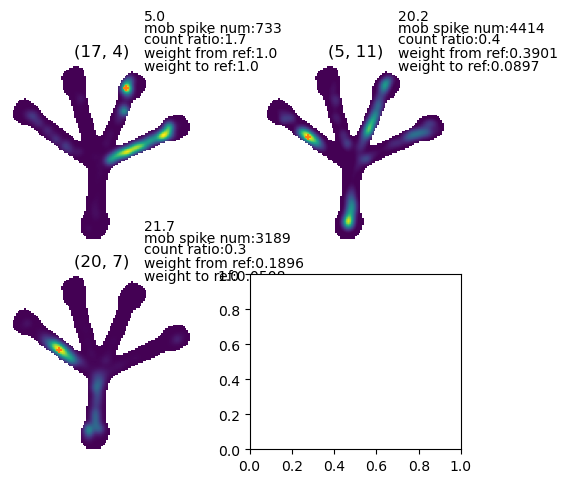

In [744]:
fig, axes = plot_place_field_group(query_cell_list,placefields,cell_list,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

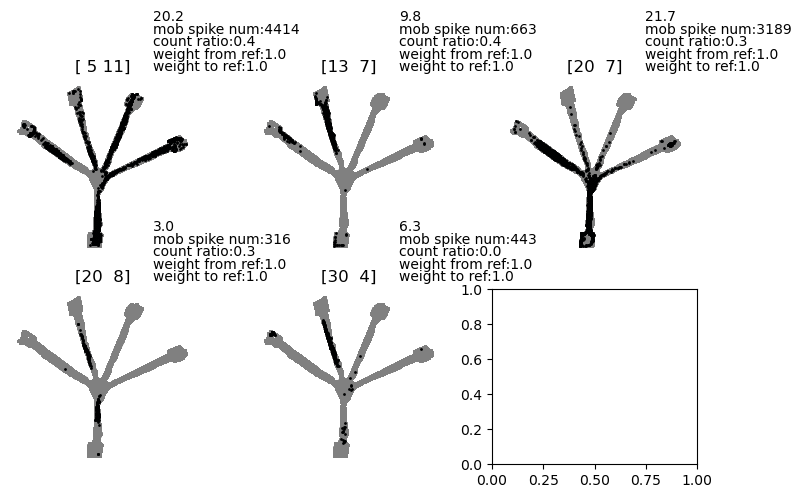

In [733]:
fig, axes = scatter_place_field_group(query_cell_list,rasters,cell_list,pos2d,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix_sub)

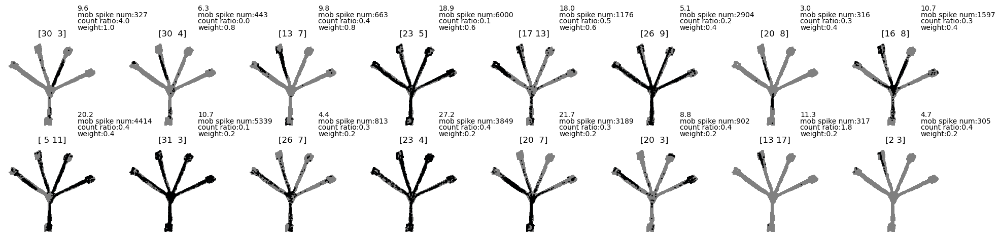

In [608]:
fig, axes = scatter_place_field_group(cells_offfield_name,rasters,cell_list,pos2d,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix_sub)

IndexError: index 5 is out of bounds for axis 0 with size 5

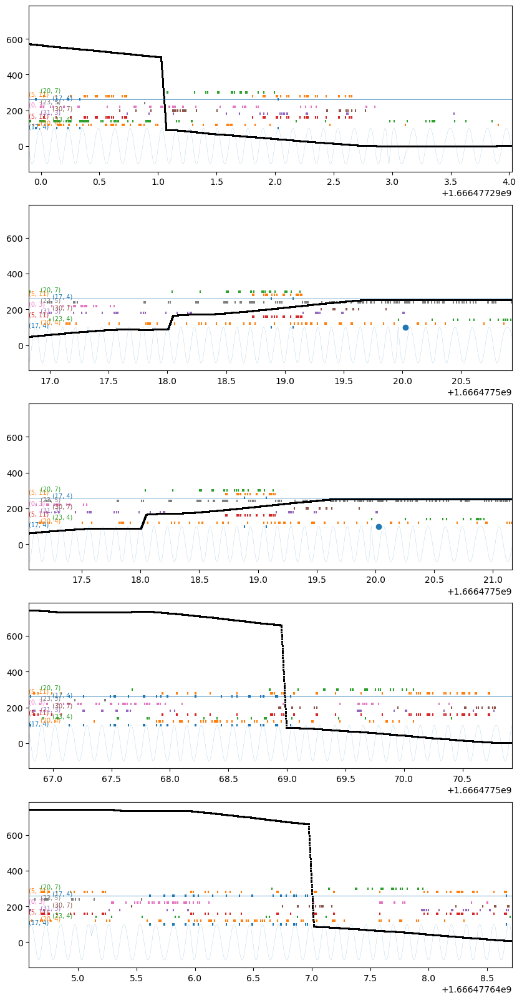

In [745]:
fig, axes = plt.subplots(len(offfield_theta_ind), 1, figsize = (10,4*len(offfield_theta_ind)), squeeze = True)

for p in range(len(offfield_theta_ind)):

    theta_index = offfield_theta_ind[p]
    (t0_, t1_) = theta_intervals_df.loc[theta_index].theta_interval
    (t0, t1) = (t0_ - 2, t1_ + 2)
    
    plot_cell_spikes(axes[p],cells_highscore,t0,t1,pos1d,nwb_units_all,ind = 0)
    axes[p].axhline(len(pairs_highscore)*20 + 100, linewidth = 0.5)

    
    #plot_cell_spikes(axes[p],cells_offfield_name,t0,t1,pos1d,nwb_units_all,ind = len(pairs_highscore))
    #plot_cell_spikes(axes[p],cells_fragmented,t0,t1,pos1d,nwb_units_all,ind = len(pairs_highscore))

    plot_cell_spikes(axes[p],query_cell_list,t0,t1,pos1d,nwb_units_all,ind = len(pairs_highscore))
    
    
    axes[p].scatter(StateScript.timestamp_O, StateScript.rewardNum*100)

    theta_ind = np.argwhere( np.logical_and(theta_df.index >= t0, theta_df.index <= t1) ).ravel()
    theta_plot = np.cos(theta_df.iloc[theta_ind].phase0)
    axes[p].plot(theta_plot.index,np.array(theta_plot)*100,linewidth = 0.1)
        
    axes[p].set_xlim([t0,t1])

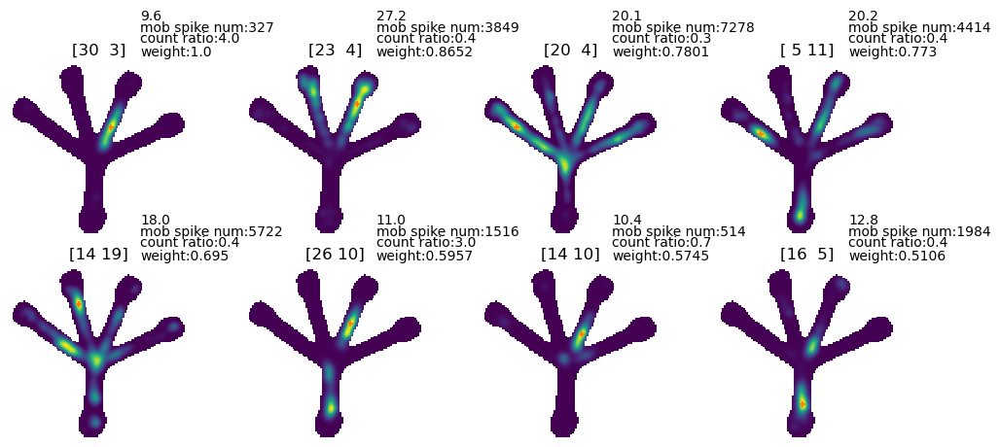

In [621]:
fig, axes = plot_place_field_group(cells_highscore,placefields,cell_list,
                           peak_frs = peak_frs,
                           mobility_spike_counts = mobility_spike_counts,
                           count_ratio = count_ratio, #the spike count ratio between continuous and frag replays
                           ref_cell_ind = ref_cell_ind,
                           weightMatrix = weightMatrix)

### 7. do plotting with decode

In [446]:
all_epochs=list((TrialChoice() & {'nwb_file_name':nwb_copy_file_name}).fetch('epoch'))
encoding_set = '2Dheadspeed_above_4_andlowmua'
classifier_param_name = 'default_decoding_gpu_4armMaze'
decode_threshold_method = 'MUA_0SD'
causal = False
if causal:
    causal_str = 'causal'
else:
    causal_str = 'acausal'

decoding_path = (DecodeResultsLinear() & {'nwb_file_name':nwb_copy_file_name}).fetch('posterior')[0]
savefolder = os.path.join(os.path.split(decoding_path)[0],
                        nwb_file_name,'theta'+'_'+encoding_set+'_'+causal_str+'_'+classifier_param_name+'_'+decode_threshold_method,
                        session_name)
isExist = os.path.exists(savefolder)
if not isExist:
    os.makedirs(savefolder)

In [240]:
from spyglass.shijiegu.load import load_epoch_data
from spyglass.shijiegu.ripple_add_replay import plot_decode_spiking

In [447]:
linear_map,node_location=get_linearization_map()
(epoch_name,log_df,decode,head_speed,head_orientation,linear_position_df,
        lfp_df,theta_not_skagg,ripple_df,neural_df,_) = load_epoch_data(nwb_copy_file_name,epoch_ID,
                                                  classifier_param_name,
                                                  encoding_set)

[11:18:31][WARNING] Spyglass: Deprecation: this class has been moved out of spyglass.common.common_position
	TrackGraph -> spyglass.linearization.v0.main.TrackGraph
Please use the new location.


epoch name 08_Seq2Session4
epoch_pos_name pos 7 valid times


[2024-08-17 11:18:32,546][WARNING]: Skipped checksum for file with hash: 6e8ac500-c1d2-7373-bab6-1ab9c9508c3e, and path: /stelmo/nwb/analysis/eliot20221022/eliot20221022_8CD94Z2Z6X.nwb


In [746]:
cofiring_trials = np.unique([theta_intervals_df.loc[t].trial_number for t in offfield_theta_ind])
cofiring_trials

array([ 5, 13, 15, 19, 20, 23, 26, 30, 34, 36, 41, 43, 44, 46, 48, 51, 55,
       59, 61, 63, 72, 75])

In [ ]:
t0t1 = np.array([theta_intervals_df.loc[cycle].theta_interval for cycle in offfield_theta_ind])

for t in cofiring_trials:
    # pages of 2 min each around each theta cycle
    #theta_index = cofiring_theta_cycle_ind[p]
    #(t0_, t1_) = theta_intervals_df.loc[theta_index].theta_interval
    #(t0, t1) = (t0_ - 1, t1_ + 1)
    
#for t in log_df.index[1:-2][10:20]:

    #t0t1 = [t0_, t1_] #shading
    """outbound"""
    plottimes = [log_df.loc[t].timestamp_O - 5,log_df.loc[t].timestamp_O]
    
    savename = 'trial' + str(t) + '_outbound_' + nwb_copy_file_name[:-5] + '_' + session_name
    axes = plot_decode_spiking(plottimes,t0t1,linear_position_df,decode,lfp_df,theta_not_skagg,
                               None,None,head_speed,head_orientation,
                               ripple_consensus_trace=None,
                               title=savename,savefolder=[],savename=[],
                               simple=True,tetrode2ind = None,mua_thresh = 0, causal = causal,
                               plot_spiking=False)
    
    plot_cell_spikes(axes[3],cells_highscore,plottimes[0],plottimes[1],pos1d,nwb_units_all,
               ind = 0)
    axes[3].axhline(len(pairs_highscore)*20 + 100, linewidth = 0.5)
    plot_cell_spikes(axes[3],cells_fragmented,plottimes[0],plottimes[1],pos1d,nwb_units_all,
               ind = len(pairs_highscore))
    
    plt.savefig(os.path.join(savefolder,savename+'.pdf'),format="pdf",bbox_inches='tight',dpi=200)
    
    """inbound"""
    if not np.isnan(log_df.loc[t+1].timestamp_H):
        plottimes = [log_df.loc[t+1].timestamp_H - 5, log_df.loc[t+1].timestamp_H]
    else:
        plottimes = [log_df.loc[t].timestamp_O + 2,log_df.loc[t].timestamp_O + 2 + 5]
    
    savename = 'trial' + str(t) + '_inbound_' + nwb_copy_file_name[:-5] + '_' + session_name
    axes = plot_decode_spiking(plottimes,t0t1,linear_position_df,decode,lfp_df,theta_not_skagg,
                               None,None,head_speed,head_orientation,
                               ripple_consensus_trace=None,
                               title=savename,savefolder=[],savename=[],
                               simple=True,tetrode2ind = spikeColInd,mua_thresh = 0, causal = causal,
                               plot_spiking=False)
    
    plot_cell_spikes(axes[3],cells_highscore,plottimes[0],plottimes[1],pos1d,nwb_units_all,
               ind = 0)
    axes[3].axhline(len(pairs_highscore)*20 + 100, linewidth = 0.5)
    plot_cell_spikes(axes[3],cells_fragmented,plottimes[0],plottimes[1],pos1d,nwb_units_all,
               ind = len(pairs_highscore))

    plt.savefig(os.path.join(savefolder,savename+'.pdf'),format="pdf",bbox_inches='tight',dpi=200)

In [84]:
cell_list_by_arm, cell_list_ind_by_arm = cell_by_arm(peak1ds_list, cell_list)

# color code by spike count ratio
log_ratio = np.log(count_ratio)
norm = matplotlib.colors.Normalize(vmin=-1, vmax=2)
cmap = matplotlib.cm.get_cmap('YlGn_r')

color_ratio = {}
for cell_ind in range(len(cell_list)):
    cell = cell_list[cell_ind]
    color_ratio[cell]  = cmap(norm(log_ratio[cell_ind]))

# color code by place field peak location
norm = matplotlib.colors.Normalize(vmin=0, vmax=800)
cmap = matplotlib.cm.get_cmap('jet')

color_fieldPeak = {}
for cell_ind in range(len(cell_list)):
    cell = cell_list[cell_ind]
    color_fieldPeak[cell]  = cmap(norm(peak1ds_list[cell_ind]))

# for home, color them as grey
cmap_bone = matplotlib.cm.get_cmap('bone')
rgba_grey = cmap_bone(0.5)
for cell in cell_list_by_arm['home']:
    color_fieldPeak[tuple(cell)]  = rgba_grey

[13:51:45][WARNING] Spyglass: Deprecation: this class has been moved out of spyglass.common.common_position
	TrackGraph -> spyglass.linearization.v0.main.TrackGraph
Please use the new location.


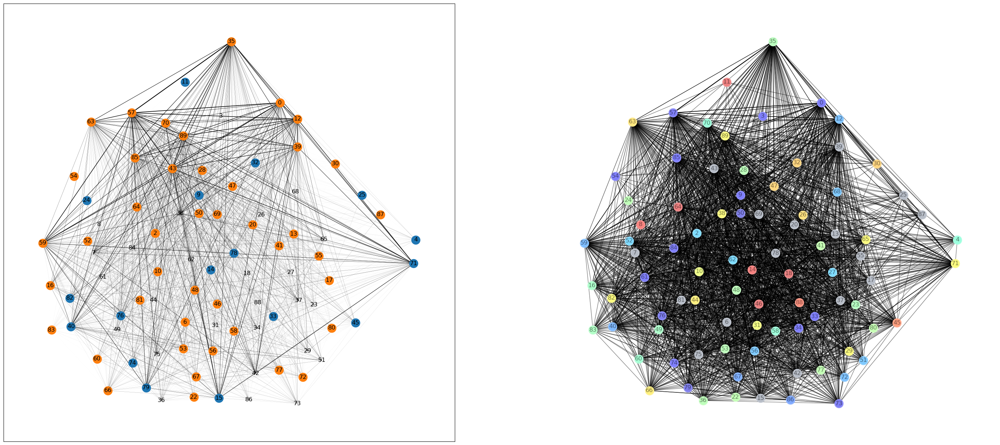

In [98]:
plot_graph(G, cell_list, cell0_list = cells_frag, cell1_list = cells_cont, 
           color_fieldPeak = color_fieldPeak, color_ratio = color_ratio, version = 0)

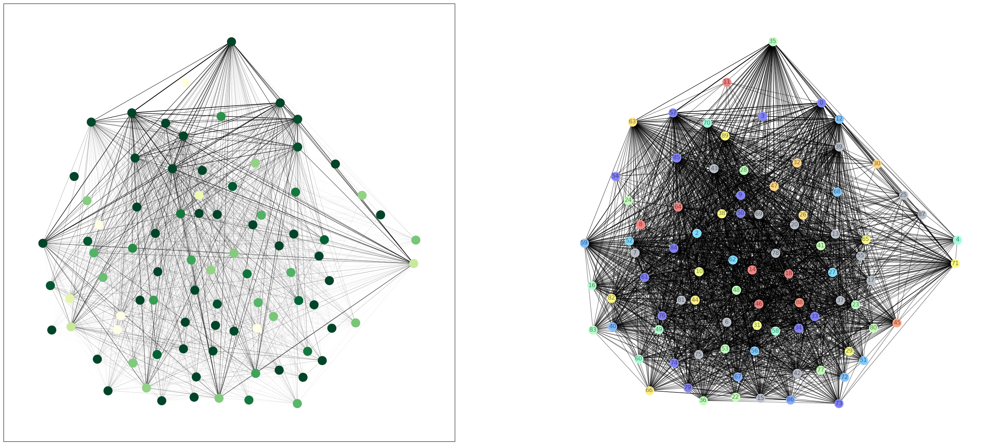

In [85]:
plot_graph(G, cell_list, cell0_list = None, cell1_list = None, 
           color_fieldPeak = color_fieldPeak, color_ratio = color_ratio, version = 1)